In [4]:
#imports
import os
import pandas as pd
import matplotlib.pyplot as plt

os.chdir('/content/sample_data/data')


from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from lightgbm import LGBMRegressor
import numpy as np
import itertools
import requests
import pandas as pd
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score





#from sktime.forecasting.compose import make_reduction
#from sktime.forecasting.model_selection import temporal_train_test_split
#from sktime.forecasting.arima import AutoARIMA
#from sktime.forecasting.ets import AutoETS

import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

seed_value = 123

#import openmeteo_requests

#import requests_cache
#from retry_requests import retry
from datetime import datetime
import requests

In [5]:
energy_production = pd.read_csv('Solar_Energy_Production.csv')
energy_production_sites = pd.read_csv('Solar_Photovoltaic_Sites.csv')


In [6]:
energy_production_sites.head(5)

,id,name,address_orig,address,latitude,longitude,location,installationDate,public_url,manufacturerName,modelName,maximumPower,City Quadrants,Ward Boundaries,Calgary Communities
0,NaN,Municipal Building,800 MacLeod TR SE,800 MACLEOD TR SE,51.045414,-114.056546,"(51.04541403, -114.0565464)",2008/01/01,NaN,NaN,NaN,NaN,3,7,262
1,NaN,Fire Station No. 30 - McKenzie Towne,6 McKenzie Towne GA SE,6 MCKENZIE TOWNE GA SE,50.916432,-113.963070,"(50.91643163, -113.963069726759)",2010/01/01,NaN,NaN,NaN,NaN,3,4,46
2,NaN,Ralph Klein Legacy Park,12350 84 ST SE,12350 84 ST SE,50.937563,-113.903017,"(50.93756317, -113.9030174)",2010/01/01,NaN,NaN,NaN,NaN,3,4,211
3,NaN,Fire Station No. 8 – Rosscarrock,1720 45 ST SW,1720 45 ST SW,51.038673,-114.152118,"(51.03867255, -114.1521183)",2011/01/01,NaN,NaN,NaN,NaN,1,14,281
4,NaN,Fire Station No. 22 - Temple,7199 Temple DR NW,7199 TEMPLE DR NE,51.091770,-113.957493,"(51.09177006, -113.9574929)",2011/01/01,NaN,NaN,NaN,NaN,4,9,22


In [7]:
energy_production

,name,id,address,date,kWh,public_url,installationDate,uid
0,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 08:00:00 AM,1.130,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 08:00:00
1,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 09:00:00 AM,2.340,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 09:00:00
2,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 10:00:00 AM,3.656,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 10:00:00
3,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 11:00:00 AM,4.577,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 11:00:00
4,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 12:00:00 PM,6.506,https://monitoring.solaredge.com/solaredge-web...,2016/11/07,3141062017-09-11 12:00:00
...,...,...,...,...,...,...,...,...
258418,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 03:00:00 PM,201.285,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 15:00:00
258419,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 04:00:00 PM,162.582,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 16:00:00
258420,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 05:00:00 PM,107.060,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 17:00:00
258421,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 06:00:00 PM,43.074,https://monitoringpublic.solaredge.com/solared...,2017/10/31,5776502023-03-12 18:00:00


### Null values

In [8]:
nulls = pd.DataFrame(energy_production.isna().mean() * 100, columns=['percentage_of_nulls'])
nulls

,percentage_of_nulls
name,0.0
id,0.0
address,0.0
date,0.0
kWh,0.0
public_url,0.0
installationDate,0.0
uid,0.0


In [9]:
nulls_sites = pd.DataFrame(energy_production_sites.isna().mean() * 100, columns=['percentage_of_nulls'])
nulls_sites

,percentage_of_nulls
id,47.619048
name,0.000000
address_orig,0.000000
address,0.000000
latitude,0.000000
longitude,0.000000
location,0.000000
installationDate,4.761905
public_url,47.619048
manufacturerName,47.619048


### check if each id in your DataFrame corresponds to only one site_name

In [10]:
energy_production.groupby('id')['name'].agg(lambda x: ', '.join(set(x)))

,name
id,
164440,Southland Leisure Centre
308057,Hillhurst Sunnyside Community Association
314106,Calgary Fire Hall Headquarters
319086,Whitehorn Multi-Service Centre
331901,City of Calgary North Corporate Warehouse
332785,Richmond - Knob Hill Community Hall
355827,Glenmore Water Treatment Plant
551172,CFD Firehall #7
570079,Manchester Building M


In [11]:
energy_production_sites.groupby('id')['name'].agg(lambda x: ', '.join(set(x)))

,name
id,
164440.0,Southland Leisure Centre
308057.0,Hillhurst Sunnyside Community Association
314106.0,Calgary Fire Hall Headquarters
319086.0,Whitehorn Multi-Service Centre
331901.0,City of Calgary North Corporate Warehouse
332785.0,Richmond - Knob Hill Community Hall
355827.0,Glenmore Water Treatment Plant
551172.0,CFD Firehall #7
570079.0,Manchester Building M


In [12]:
array2 = set(energy_production['id'].unique())
array1 = set(energy_production_sites['id'].unique())
same_elements = set(array1) - set(array2)
same_elements

{nan}

### Merge datasets on id

In [13]:
energy_production.columns
energy_production = energy_production[['name', 'id', 'address', 'date', 'kWh']]

In [14]:
energy_production_sites.columns
energy_production_sites = energy_production_sites[['id', 'latitude', 'longitude']]
energy_production_sites

,id,latitude,longitude
0,NaN,51.045414,-114.056546
1,NaN,50.916432,-113.963070
2,NaN,50.937563,-113.903017
3,NaN,51.038673,-114.152118
4,NaN,51.091770,-113.957493
5,NaN,50.957431,-114.121390
6,NaN,51.037227,-114.189256
7,NaN,51.026009,-114.094948
8,NaN,51.104155,-114.253203
9,164440.0,50.962485,-114.108472


In [15]:
merged_df = pd.merge(energy_production, energy_production_sites,on='id', how='left')
merged_df

,name,id,address,date,kWh,latitude,longitude
0,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 08:00:00 AM,1.130,51.016189,-114.036667
1,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 09:00:00 AM,2.340,51.016189,-114.036667
2,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 10:00:00 AM,3.656,51.016189,-114.036667
3,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 11:00:00 AM,4.577,51.016189,-114.036667
4,Calgary Fire Hall Headquarters,314106,1212 42 AV SE,2017/09/11 12:00:00 PM,6.506,51.016189,-114.036667
...,...,...,...,...,...,...,...
258418,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 03:00:00 PM,201.285,51.104990,-114.250011
258419,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 04:00:00 PM,162.582,51.104990,-114.250011
258420,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 05:00:00 PM,107.060,51.104990,-114.250011
258421,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2023/03/12 06:00:00 PM,43.074,51.104990,-114.250011


#### convert date column to datetime

In [16]:
merged_df['date'] = pd.to_datetime(merged_df['date'])
merged_df.rename(columns={'kWh': 'GHI'}, inplace=True)
merged_df = merged_df.sort_values(by=['name', 'date'])


### visualisation

In [17]:
m1 = merged_df[merged_df['id'] == 164440 ]
m1

,name,id,address,date,GHI,latitude,longitude
23003,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 14:30:00,27.805,50.962485,-114.108472
23005,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 15:30:00,30.559,50.962485,-114.108472
23006,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 16:30:00,23.613,50.962485,-114.108472
23007,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 17:30:00,15.257,50.962485,-114.108472
23008,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 18:30:00,7.896,50.962485,-114.108472
...,...,...,...,...,...,...,...
254590,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 14:00:00,0.046,50.962485,-114.108472
254591,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 15:00:00,0.048,50.962485,-114.108472
254592,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 16:00:00,0.048,50.962485,-114.108472
254593,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 17:00:00,0.000,50.962485,-114.108472


In [18]:
m2 = m1.sort_values(by='date')
m2

,name,id,address,date,GHI,latitude,longitude
23003,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 14:30:00,27.805,50.962485,-114.108472
23005,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 15:30:00,30.559,50.962485,-114.108472
23006,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 16:30:00,23.613,50.962485,-114.108472
23007,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 17:30:00,15.257,50.962485,-114.108472
23008,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2015-09-01 18:30:00,7.896,50.962485,-114.108472
...,...,...,...,...,...,...,...
254590,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 14:00:00,0.046,50.962485,-114.108472
254591,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 15:00:00,0.048,50.962485,-114.108472
254592,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 16:00:00,0.048,50.962485,-114.108472
254593,Southland Leisure Centre,164440,2000 SOUTHLAND DR SW,2023-03-16 17:00:00,0.000,50.962485,-114.108472


In [19]:
fig = px.line(
    merged_df,
    x='date',
    y='GHI',
    color='name',
    facet_col='name',
    facet_col_wrap=2,
    title="Solar Generation Time Series for All Sites"
)

fig.update_layout(
    xaxis_title='Datetime',
    yaxis_title='Solar Generation (kWh)',
    template='plotly_dark',
    height=900,  # Adjust height to accommodate multiple plots
    width=1200
)

# Show the plot
fig.show()

In [22]:
def api(start_date, end_date, latitude, longitude):
    """api call function.
    Keyword arguments:
    time -- desired date in "%Y-%m-%d format
    latitude -- gps coordinate
    longitude -- gps coordinate
    """
    date_string_1 = start_date + "T" + "00:00"
    date_string_2 = end_date + "T" + "00:00"
    date_object1 = datetime.strptime(date_string_1, "%Y-%m-%dT%H:%M")
    date_object2 = datetime.strptime(date_string_2, "%Y-%m-%dT%H:%M")
    date_only1 = date_object1.date()
    date_only2 = date_object2.date()
    date_string_1 = str(date_only1)
    date_string_2 = str(date_only2)
    # import dataset from API
    x = [(latitude, longitude)]
    li = []
    for i in x:
        params = {
            "latitude": i[0],
            "longitude": i[1],
            "start_date": date_string_1,
            "end_date": date_string_2,
            "timezone": "auto",
            "temperature_unit": "fahrenheit",  #  units
            "windspeed_unit": "mph",
            "precipitation_unit ": "inch",
            "hourly": {
                "precipitation",
                 "snowfall",
                "temperature_2m",
                "relativehumidity_2m",
                "surface_pressure",
                "windspeed_10m",
                "winddirection_10m",
                "windgusts_10m",
                "cloudcover",
},
            "daily": {"sunrise", "sunset"},
        }
        response = requests.get(
            "https://archive-api.open-meteo.com/v1/era5", params=params
        )
        res = response.json()
        df3 = pd.DataFrame.from_dict(res["daily"], orient="index").T
        df3 = df3.loc[df3.index.repeat(24)].reset_index(drop=True)
        df2 = pd.DataFrame.from_dict(res["hourly"], orient="index").T
        df2 = df2.assign(
            elevation=res["elevation"],
            latitude=res["latitude"],
            longitude=res["longitude"],
            timezone=res["timezone_abbreviation"],
        )
        df2["sunrise"] = df3["sunrise"]
        df2["sunset"] = df3["sunset"]
        li.append(df2)
    frame = pd.concat(li, axis=0, ignore_index=True)
    return frame, res

In [23]:
start_time = str('2023-12-04')
# last time stamp
end_time = str('2024-01-04')
lat = 46.999873
lon = 6.498147
res = api(start_time, end_time, lat, lon)

In [24]:
res

(                 time relativehumidity_2m surface_pressure winddirection_10m  \
 0    2023-12-04T00:00                  63            901.3               149   
 1    2023-12-04T01:00                  63            900.5               149   
 2    2023-12-04T02:00                  70            899.8               149   
 3    2023-12-04T03:00                  62            900.0               152   
 4    2023-12-04T04:00                  56            899.5               154   
 ..                ...                 ...              ...               ...   
 763  2024-01-04T19:00                  59            896.1               175   
 764  2024-01-04T20:00                  55            895.7               169   
 765  2024-01-04T21:00                  52            895.3               169   
 766  2024-01-04T22:00                  47            895.2               175   
 767  2024-01-04T23:00                  46            895.1               183   
 
     windgusts_10m windspe

In [25]:
merged_df

,name,id,address,date,GHI,latitude,longitude
35809,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 10:45:00,0.970,51.104990,-114.250011
35810,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 11:45:00,23.927,51.104990,-114.250011
35811,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 12:45:00,69.659,51.104990,-114.250011
35812,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 13:45:00,59.172,51.104990,-114.250011
35813,Bearspaw Water Treatment Plant,577650,11444 Bearspaw Dam RD NW,2017-11-21 14:45:00,18.061,51.104990,-114.250011
...,...,...,...,...,...,...,...
254615,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 15:00:00,173.044,51.085895,-113.983594
254616,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 16:00:00,139.806,51.085895,-113.983594
254617,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 17:00:00,91.955,51.085895,-113.983594
254618,Whitehorn Multi-Service Centre,319086,3705 35 ST NE,2023-03-16 18:00:00,37.487,51.085895,-113.983594


In [26]:
test = merged_df[merged_df['id'] == 577650]

grouped_conc = test.groupby("id")
frames = []
for id, group in grouped_conc:


    start_time = str(group["date"].iloc[0].date())
    print(start_time)
    end_time = str(group["date"].iloc[len(group) - 1].date())
    print(end_time)
    lat = group["latitude"].iloc[0]
    print(lat)
    lon = group["longitude"].iloc[0]
    print(lon)
    frame ,res = api(start_time, end_time, lat, lon)

    frames.append(frame)

frame['time'] = pd.to_datetime(frame['time'], format='%Y-%m-%dT%H:%M')
test['time'] = pd.to_datetime(test['date'], format='%Y-%m-%d %H:%M:%S')
frame = frame[['time', 'surface_pressure', 'snowfall', 'temperature_2m',
       'winddirection_10m', 'relativehumidity_2m', 'windgusts_10m',
       'windspeed_10m', 'precipitation', 'cloudcover', 'elevation', 'timezone', 'sunrise', 'sunset']]
df_merged = pd.merge(test, frame, on='time', how='left')
df_merged = pd.merge(test, frame, on='time', how='left')

2017-11-21
2023-03-16
51.10499
-114.250011


In [27]:
frame

,time,surface_pressure,snowfall,temperature_2m,winddirection_10m,relativehumidity_2m,windgusts_10m,windspeed_10m,precipitation,cloudcover,elevation,timezone,sunrise,sunset
0,2017-11-21 00:00:00,895.3,0.0,12.0,118,80,11.2,5.3,0.0,94,1088.0,MST,2017-11-21T08:04,2017-11-21T16:41
1,2017-11-21 01:00:00,895.3,0.0,10.9,119,79,13.2,5.9,0.0,98,1088.0,MST,2017-11-21T08:04,2017-11-21T16:41
2,2017-11-21 02:00:00,895.9,0.0,10.9,119,78,12.8,5.9,0.0,92,1088.0,MST,2017-11-21T08:04,2017-11-21T16:41
3,2017-11-21 03:00:00,895.1,0.0,10.7,116,78,14.1,6.7,0.0,73,1088.0,MST,2017-11-21T08:04,2017-11-21T16:41
4,2017-11-21 04:00:00,894.4,0.0,9.9,122,78,14.3,6.3,0.0,49,1088.0,MST,2017-11-21T08:04,2017-11-21T16:41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46603,2023-03-16 19:00:00,896.5,0.0,21.1,73,69,8.1,6.3,0.0,13,1088.0,MST,2023-03-16T06:47,2023-03-16T18:42
46604,2023-03-16 20:00:00,898.3,0.0,27.0,38,58,8.3,2.6,0.0,0,1088.0,MST,2023-03-16T06:47,2023-03-16T18:42
46605,2023-03-16 21:00:00,898.1,0.0,24.5,209,63,5.8,4.1,0.0,0,1088.0,MST,2023-03-16T06:47,2023-03-16T18:42
46606,2023-03-16 22:00:00,897.5,0.0,22.7,223,67,6.0,4.0,0.0,0,1088.0,MST,2023-03-16T06:47,2023-03-16T18:42


In [28]:
df_cleaned = df_merged.dropna()
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24533 entries, 6 to 24868
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   name                 24533 non-null  object        
 1   id                   24533 non-null  int64         
 2   address              24533 non-null  object        
 3   date                 24533 non-null  datetime64[ns]
 4   GHI                  24533 non-null  float64       
 5   latitude             24533 non-null  float64       
 6   longitude            24533 non-null  float64       
 7   time                 24533 non-null  datetime64[ns]
 8   surface_pressure     24533 non-null  object        
 9   snowfall             24533 non-null  object        
 10  temperature_2m       24533 non-null  object        
 11  winddirection_10m    24533 non-null  object        
 12  relativehumidity_2m  24533 non-null  object        
 13  windgusts_10m        24533 non-null 

In [29]:
df_cleaned.columns

Index(['name', 'id', 'address', 'date', 'GHI', 'latitude', 'longitude', 'time',
       'surface_pressure', 'snowfall', 'temperature_2m', 'winddirection_10m',
       'relativehumidity_2m', 'windgusts_10m', 'windspeed_10m',
       'precipitation', 'cloudcover', 'elevation', 'timezone', 'sunrise',
       'sunset'],
      dtype='object')

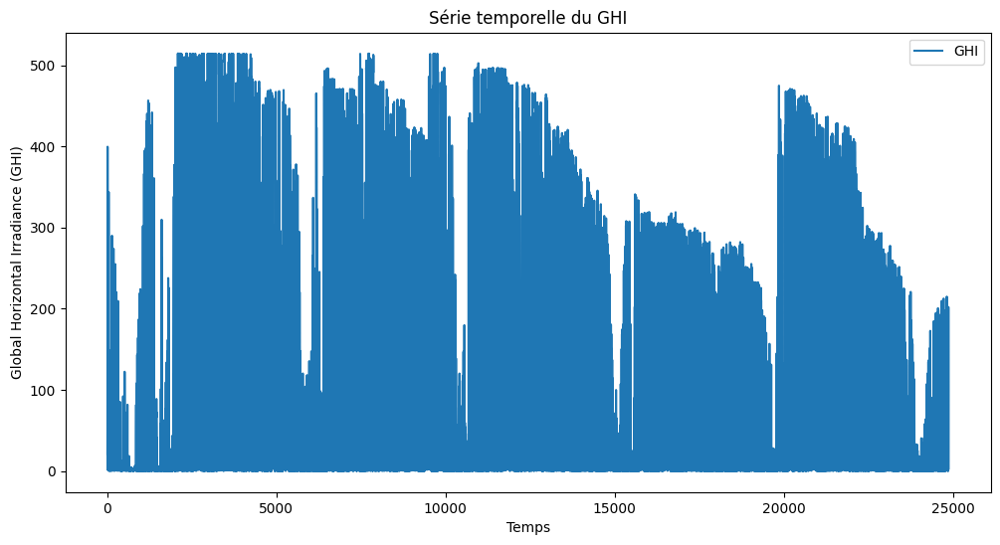

In [33]:
plt.figure(figsize=(12, 6))
plt.plot(df_cleaned['GHI'], label='GHI')
plt.xlabel('Temps')
plt.ylabel('Global Horizontal Irradiance (GHI)')
plt.title('Série temporelle du GHI')
plt.legend()
plt.show()


In [30]:
X = df_cleaned.drop(columns=['GHI','time','timezone','name','address','date','sunrise','sunset'])
y = df_cleaned['GHI']

encoder = LabelEncoder()
#X['name'] = encoder.fit_transform(X['name'])
#X['address'] = encoder.fit_transform(X['address'])
#X['date'] = encoder.fit_transform(X['date'])
#X['sunrise'] = encoder.fit_transform(X['sunrise'])
#X['sunset'] = encoder.fit_transform(X['sunset'])

X


,id,latitude,longitude,surface_pressure,snowfall,temperature_2m,winddirection_10m,relativehumidity_2m,windgusts_10m,windspeed_10m,precipitation,cloudcover,elevation
6,577650,51.10499,-114.250011,883.8,0.0,31.9,201,89,11.9,3.1,0.0,0,1088.0
8,577650,51.10499,-114.250011,884.3,0.0,33.7,173,87,8.9,3.6,0.0,3,1088.0
10,577650,51.10499,-114.250011,884.3,0.0,36.5,124,84,8.3,4.0,0.0,2,1088.0
12,577650,51.10499,-114.250011,884.4,0.0,38.3,118,80,7.6,4.3,0.0,2,1088.0
14,577650,51.10499,-114.250011,884.0,0.0,39.9,129,76,8.3,4.6,0.0,97,1088.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24864,577650,51.10499,-114.250011,898.1,0.0,37.2,308,37,8.9,4.0,0.0,11,1088.0
24865,577650,51.10499,-114.250011,897.8,0.0,36.7,297,41,8.9,3.5,0.0,0,1088.0
24866,577650,51.10499,-114.250011,898.7,0.0,32.3,148,65,7.4,6.8,0.0,2,1088.0
24867,577650,51.10499,-114.250011,898.5,0.0,30.1,125,58,12.8,4.7,0.0,0,1088.0


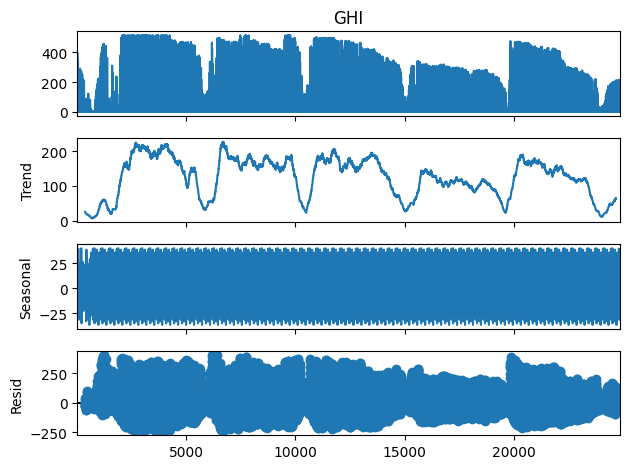

In [36]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(df_cleaned['GHI'], model='additive', period=365)
result.plot()
plt.show()


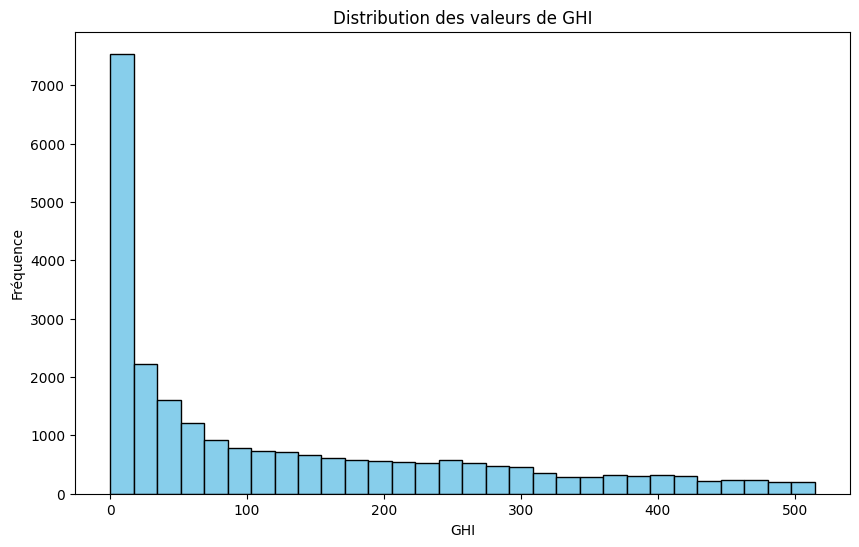

In [38]:
plt.figure(figsize=(10, 6))
plt.hist(df_cleaned['GHI'], bins=30, color='skyblue', edgecolor='black')
plt.xlabel('GHI')
plt.ylabel('Fréquence')
plt.title('Distribution des valeurs de GHI')
plt.show()


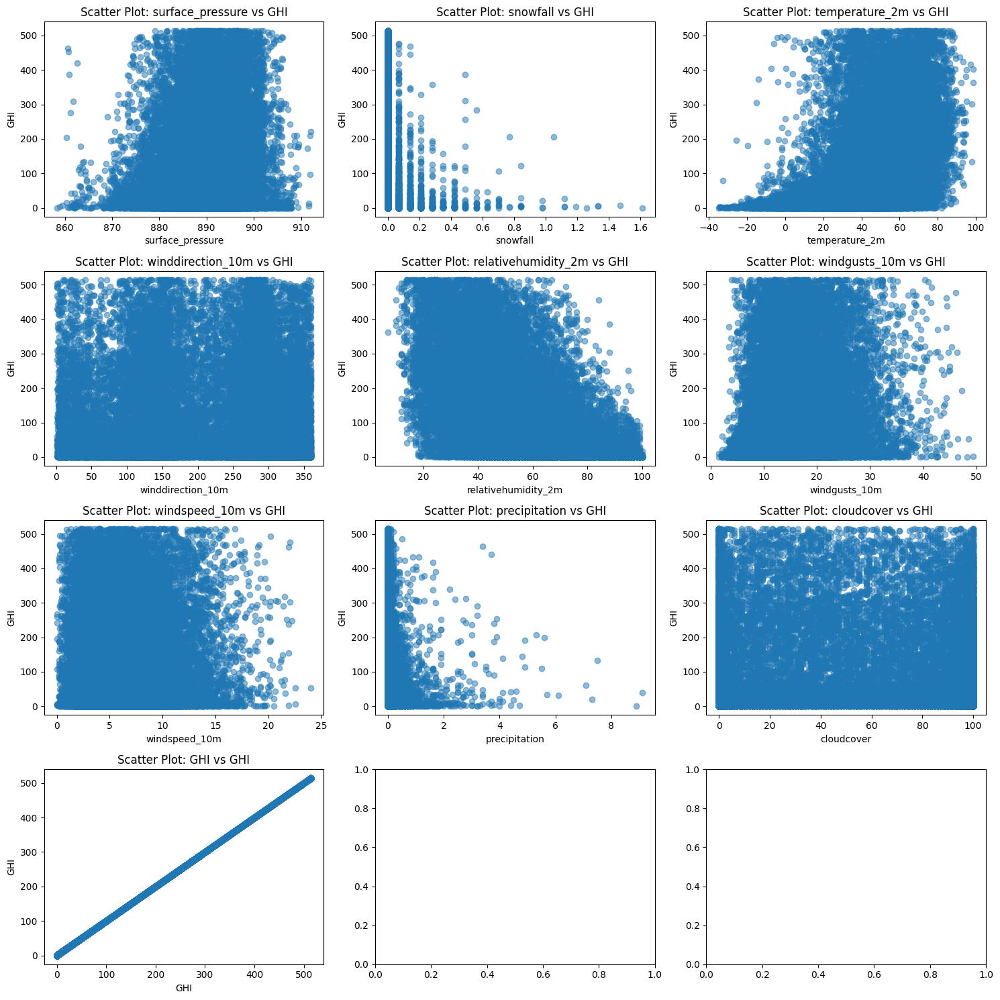

In [44]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axes = axes.flatten()

variables = ['surface_pressure', 'snowfall', 'temperature_2m',
                        'winddirection_10m', 'relativehumidity_2m', 'windgusts_10m',
                        'windspeed_10m', 'precipitation', 'cloudcover', 'GHI']

for i, variable in enumerate(variables):
    try:
        axes[i].scatter(df_cleaned[variable], df_cleaned['GHI'], alpha=0.5)
        axes[i].set_title(f'Scatter Plot: {variable} vs GHI')
        axes[i].set_xlabel(variable)
        axes[i].set_ylabel('GHI')
    except KeyError:
        print(f"Column '{variable}' not found in DataFrame.")

plt.tight_layout()
plt.show()



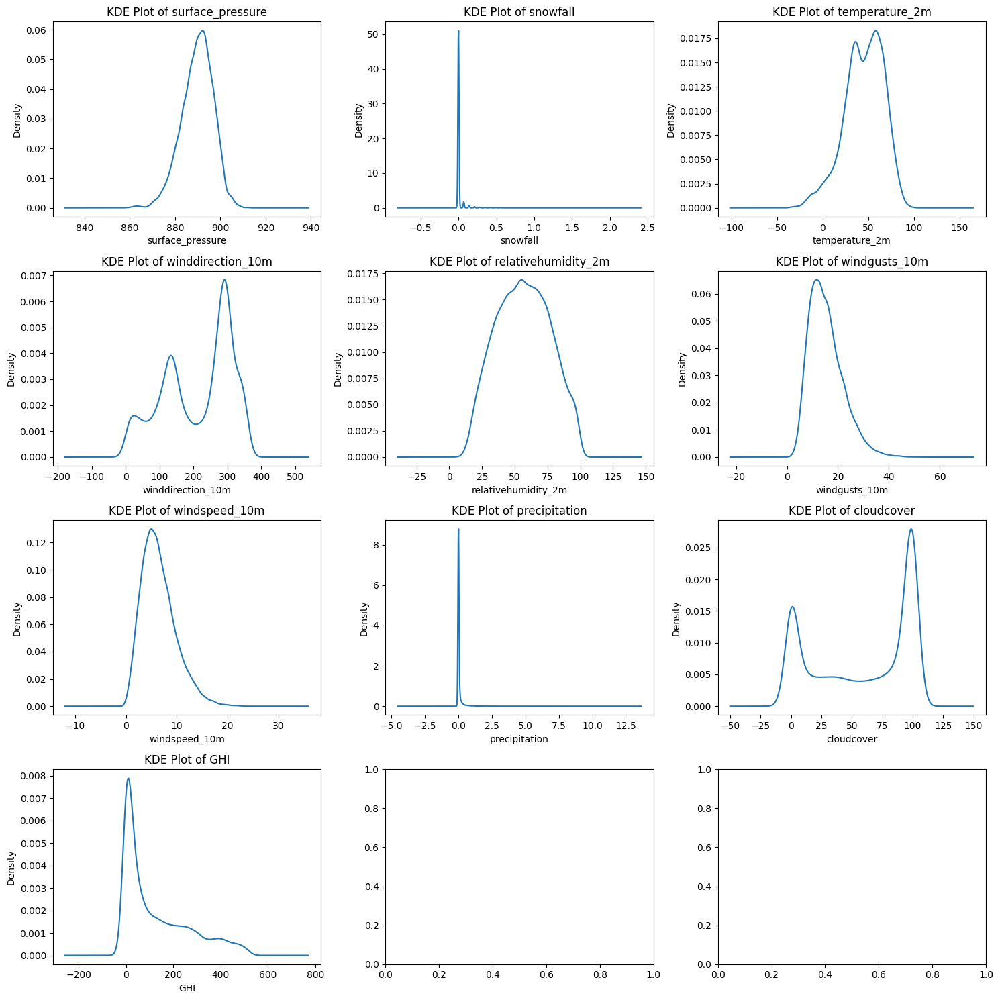

In [50]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axes = axes.flatten()

variables = ['surface_pressure', 'snowfall', 'temperature_2m',
                        'winddirection_10m', 'relativehumidity_2m', 'windgusts_10m',
                        'windspeed_10m', 'precipitation', 'cloudcover', 'GHI']

for i, variable in enumerate(variables):
    try:
        df_cleaned[variable].plot(kind='kde', ax=axes[i])
        axes[i].set_title(f'KDE Plot of {variable}')
        axes[i].set_xlabel(variable)
        axes[i].set_ylabel('Density')
    except KeyError:
        print(f"Column '{variable}' not found in DataFrame.")

plt.tight_layout()
plt.show()


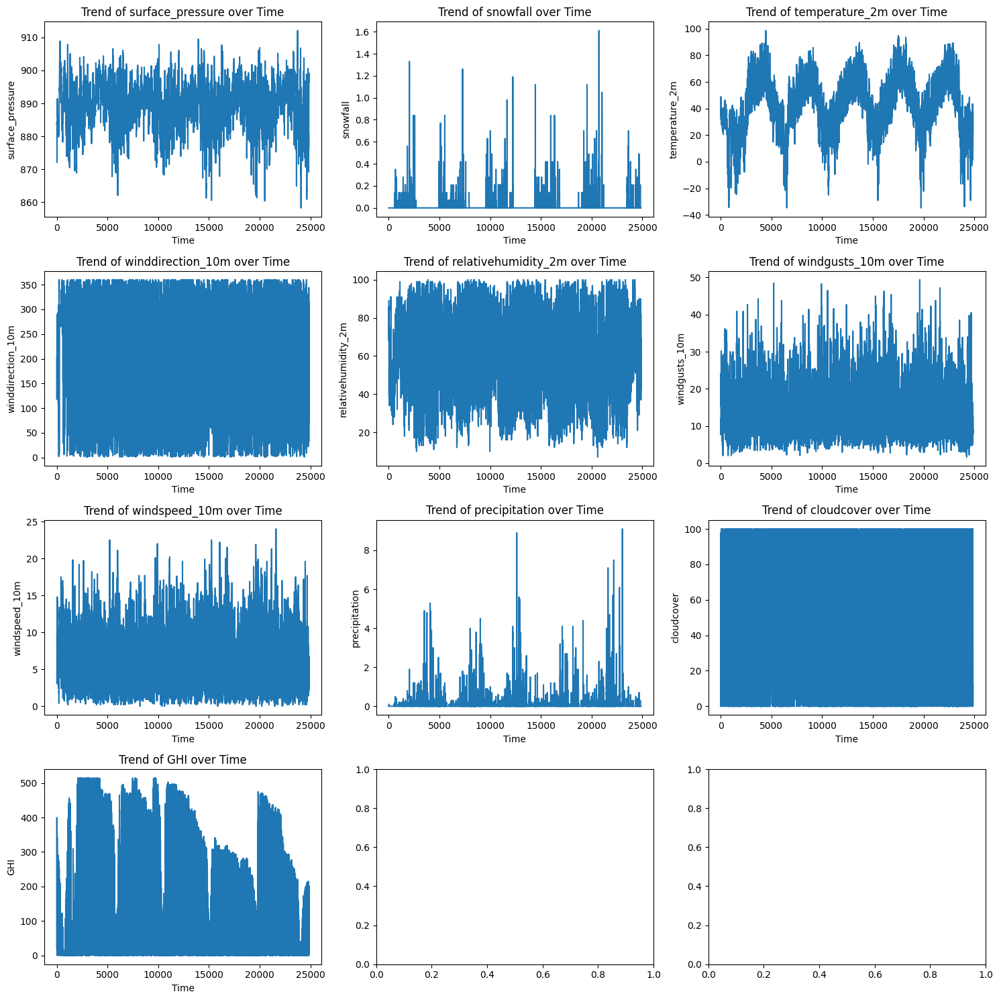

In [52]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axes = axes.flatten()


variables = ['surface_pressure', 'snowfall', 'temperature_2m',
                        'winddirection_10m', 'relativehumidity_2m', 'windgusts_10m',
                        'windspeed_10m', 'precipitation', 'cloudcover', 'GHI']

for i, variable in enumerate(variables):
    try:
        axes[i].plot(df_cleaned.index, df_cleaned[variable])
        axes[i].set_title(f'Trend of {variable} over Time')
        axes[i].set_xlabel('Time')
        axes[i].set_ylabel(variable)
    except KeyError:
        print(f"Column '{variable}' not found in DataFrame.")

plt.tight_layout()
plt.show()


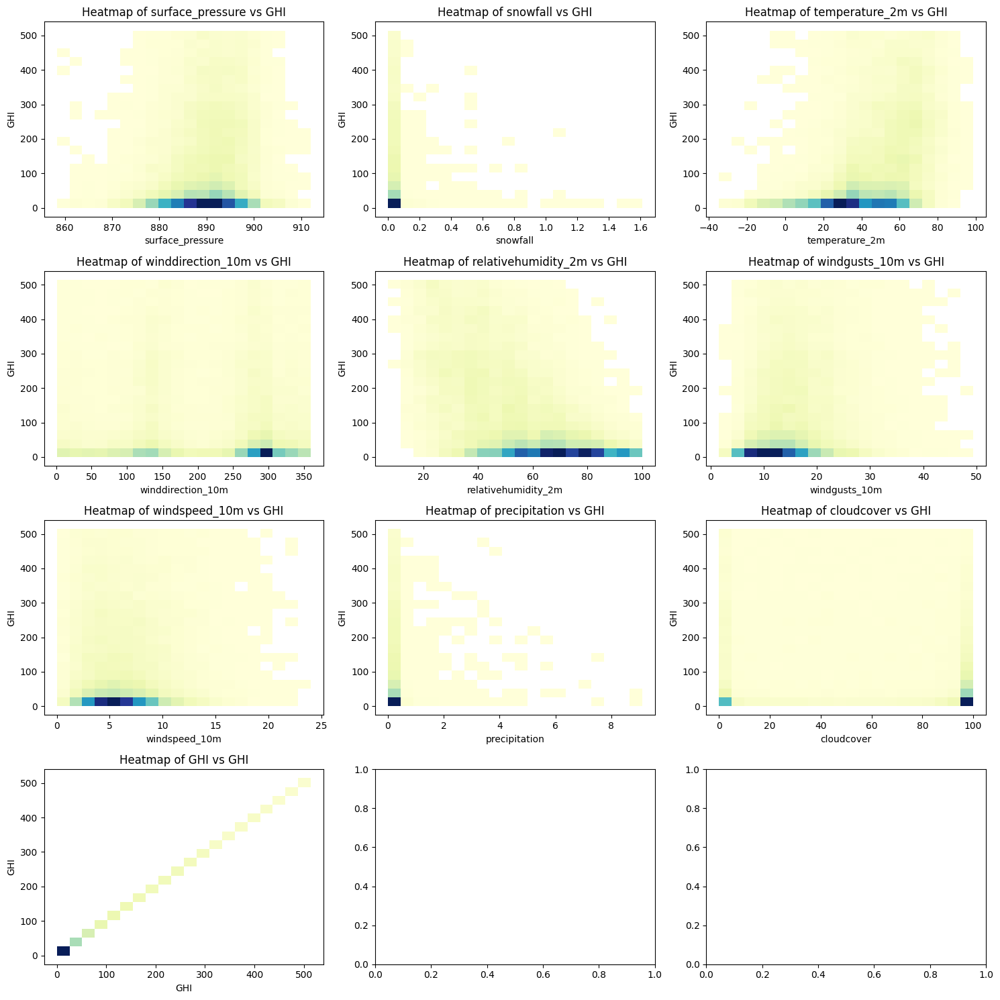

In [53]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axes = axes.flatten()


variables = ['surface_pressure', 'snowfall', 'temperature_2m',
                        'winddirection_10m', 'relativehumidity_2m', 'windgusts_10m',
                        'windspeed_10m', 'precipitation', 'cloudcover', 'GHI']

for i, variable in enumerate(variables[:len(axes)]):
    try:
        sns.histplot(x=df_cleaned[variable], y=df_cleaned['GHI'], ax=axes[i], cmap="YlGnBu", bins=20)
        axes[i].set_title(f'Heatmap of {variable} vs GHI')
        axes[i].set_xlabel(variable)
        axes[i].set_ylabel('GHI')
    except KeyError:
        print(f"Column '{variable}' not found in DataFrame.")

plt.tight_layout()
plt.show()


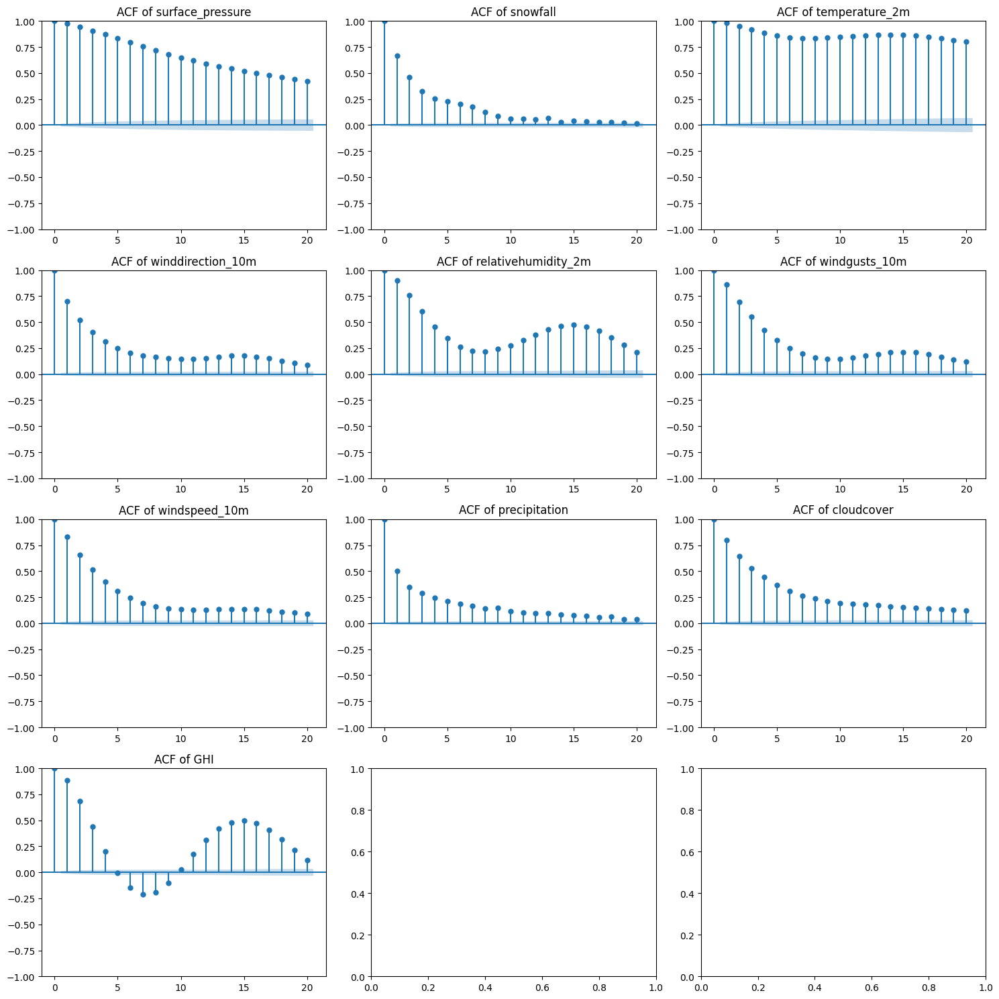

In [55]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

variables = ['surface_pressure', 'snowfall', 'temperature_2m',
                        'winddirection_10m', 'relativehumidity_2m', 'windgusts_10m',
                        'windspeed_10m', 'precipitation', 'cloudcover', 'GHI']

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axes = axes.flatten()

for i, variable in enumerate(variables):
    try:
        plot_acf(df_cleaned[variable].dropna(), lags=20, ax=axes[i])
        axes[i].set_title(f'ACF of {variable}')
    except KeyError:
        print(f"Column '{variable}' not found in DataFrame.")

plt.tight_layout()
plt.show()

relativehumidity_2m    0.355003
temperature_2m         0.155778
winddirection_10m      0.105036
surface_pressure       0.104555
windgusts_10m          0.100076
windspeed_10m          0.097529
cloudcover             0.073290
precipitation          0.007563
snowfall               0.001169
id                     0.000000
latitude               0.000000
longitude              0.000000
elevation              0.000000
dtype: float64


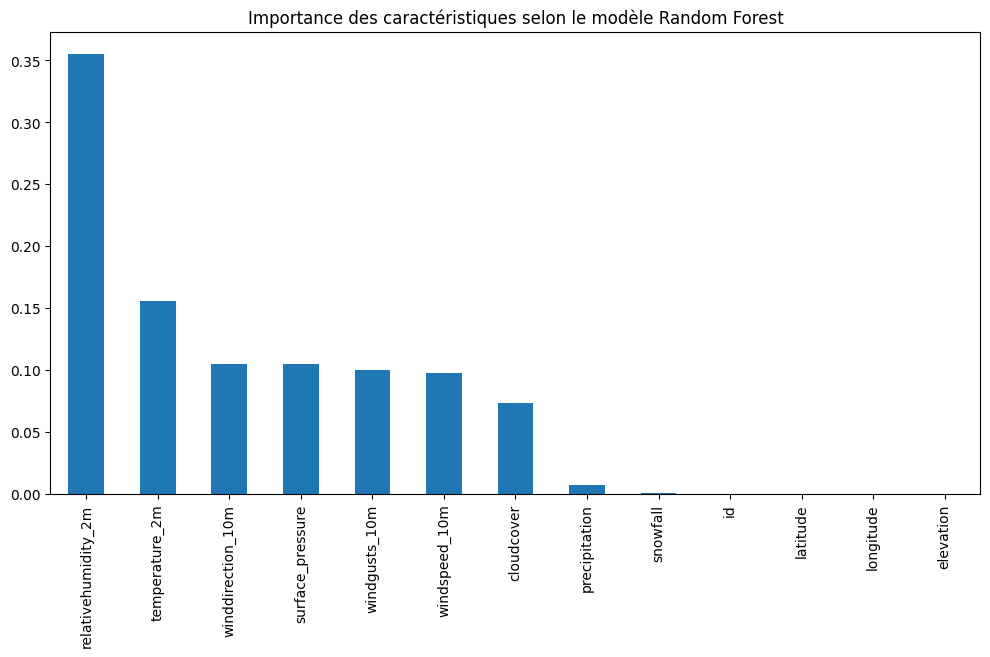

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)
from sklearn.ensemble import RandomForestRegressor

# Entraîner un modèle Random Forest sur toutes les variables
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Importance des caractéristiques
feature_importances = pd.Series(rf_model.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
print(feature_importances)

# Visualiser les importances
feature_importances.plot(kind='bar', figsize=(12, 6))
plt.title("Importance des caractéristiques selon le modèle Random Forest")
plt.show()

In [ ]:
#X = df_cleaned.drop(columns=['id','latitude','longitude','elevation'])
X = df_cleaned.drop(columns=['GHI','time','timezone','name','address','date','sunrise','sunset','latitude','longitude','elevation','id'])
y = df_cleaned['GHI']
X

,surface_pressure,snowfall,temperature_2m,winddirection_10m,relativehumidity_2m,windgusts_10m,windspeed_10m,precipitation,cloudcover
6,883.8,0.0,31.9,201,89,11.9,3.1,0.0,0
8,884.3,0.0,33.7,173,87,8.9,3.6,0.0,3
10,884.3,0.0,36.5,124,84,8.3,4.0,0.0,2
12,884.4,0.0,38.3,118,80,7.6,4.3,0.0,2
14,884.0,0.0,39.9,129,76,8.3,4.6,0.0,97
...,...,...,...,...,...,...,...,...,...
24864,898.1,0.0,37.2,308,37,8.9,4.0,0.0,11
24865,897.8,0.0,36.7,297,41,8.9,3.5,0.0,0
24866,898.7,0.0,32.3,148,65,7.4,6.8,0.0,2
24867,898.5,0.0,30.1,125,58,12.8,4.7,0.0,0


In [ ]:
X.dtypes

,0
surface_pressure,object
snowfall,object
temperature_2m,object
winddirection_10m,object
relativehumidity_2m,object
windgusts_10m,object
windspeed_10m,object
precipitation,object
cloudcover,object


### Modèle SVR

In [ ]:

# 2. Séparation des données en ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# Modèle 3 : Support Vector Regressor (SVR) avec GridSearchCV pour optimisation
param_grid = {
    'C': [0.1, 1, 10],
    'epsilon': [0.01, 0.1, 1],
    'gamma': ['scale', 'auto']
}
svr = SVR(kernel='rbf')
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Meilleur modèle SVR
best_svr = grid_search.best_estimator_
y_pred_svr = best_svr.predict(X_test)
print("SVR MAE:", mean_absolute_error(y_test, y_pred_svr))
print("SVR RMSE:", mean_squared_error(y_test, y_pred_svr, squared=False))
print("SVR R^2:", r2_score(y_test, y_pred_svr))

# Affichage des meilleurs paramètres pour SVR
print("Best parameters for SVR:", grid_search.best_params_)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
SVR MAE: 73.20523196324761
SVR RMSE: 100.62204345924677
SVR R^2: 0.33048143268409835
Best parameters for SVR: {'C': 10, 'epsilon': 0.01, 'gamma': 'scale'}


# Modèle KNN

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Définition de la grille de valeurs pour n_neighbors
param_grid = {'n_neighbors': np.arange(1, 20)}

# Initialisation du modèle KNN avec recherche de grille
knn = KNeighborsRegressor()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Meilleur modèle trouvé
best_knn = grid_search.best_estimator_
print("Meilleure valeur pour n_neighbors:", grid_search.best_params_['n_neighbors'])

# Prédictions avec le meilleur modèle
y_pred = best_knn.predict(X_test)

# Calcul des métriques
rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
precision_percentage = r2 * 100

print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)
print("Coefficient de détermination (R²):", r2)
print("Précision (R²) en pourcentage:", precision_percentage, "%")


Meilleure valeur pour n_neighbors: 15
Root Mean Squared Error (RMSE): 127.04083864823212
Mean Absolute Error (MAE): 107.74936754296583
Coefficient de détermination (R²): -0.06724238306389596
Précision (R²) en pourcentage: -6.724238306389596 %
